In [1]:
import numpy as np
from tools.general import Trajectory, Display
from tools.gridsearch import DisplayGridSearch
from tools.voronoi import MonteCarloSearch, DisplayVoronoi

In [2]:
N_planets = 3
planet_radius = 0.1
gravity_constant = 0.1
traj_boundaries = np.array([[-1,1],[-1,1]])
dt = 0.01
Tmax = 100

traj = Trajectory(N_planets, planet_radius, gravity_constant, traj_boundaries, dt, Tmax)
planets_loc = traj.gen_planets(traj.bounds, 0.2) ; p0 = traj.gen_shuttle(0.2)

# uncomment and modify p0 to load a previously saved configuration
#p0 = np.array([0.0, 0.0]); planets_loc = np.load('save/planets_loc/[{}, {}].npy'.format(p0[0],p0[1])); traj.reset(p0,loc = planets_loc)

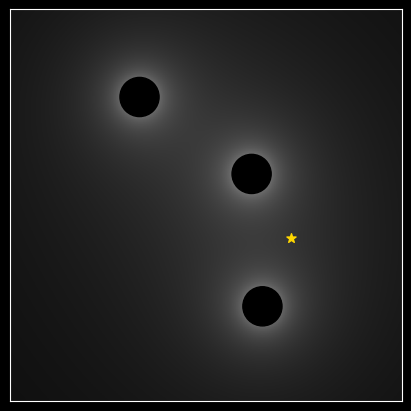

In [3]:
d = Display(traj)
d.plot_config()

In [4]:
n = 100

In [5]:
d = DisplayGridSearch(traj,n)

1 maximum(s) - proposal [89, 4] : v = [0.36,-0.75]


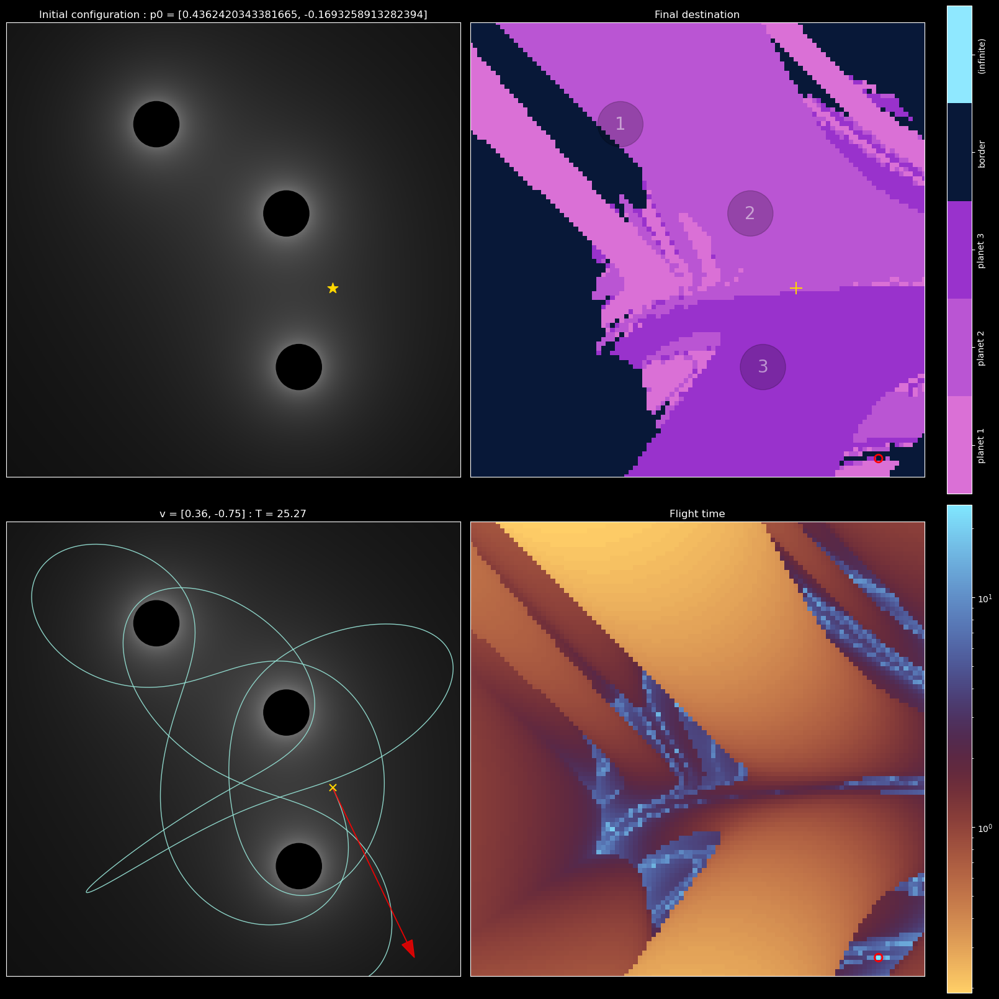

In [6]:
d.plot4(save=True)

In [7]:
mc = MonteCarloSearch(traj,n*n)

1 maximum(s) - proposal [9741] : v = [-0.68,-0.37]


In [8]:
dmc = DisplayVoronoi(traj,mc)

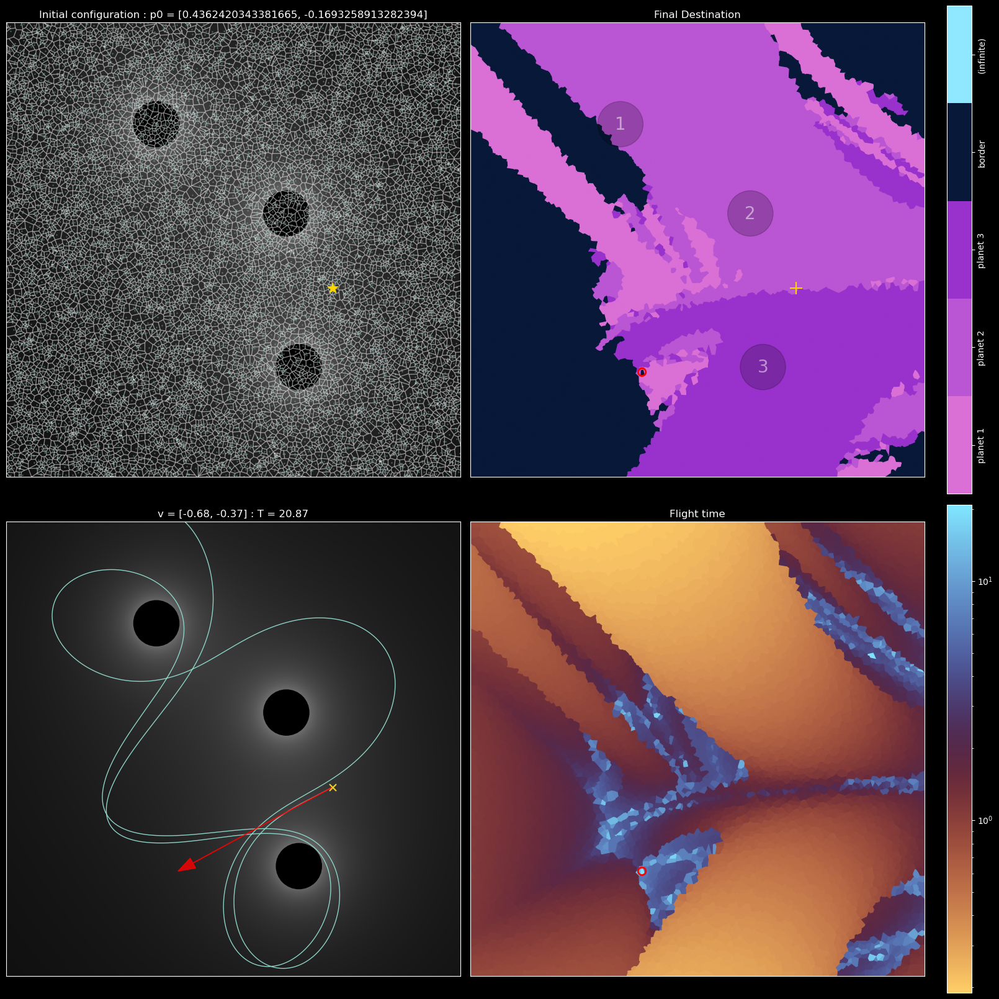

In [9]:
dmc.plot4(save=True)

In [10]:
import matplotlib.pyplot as plt

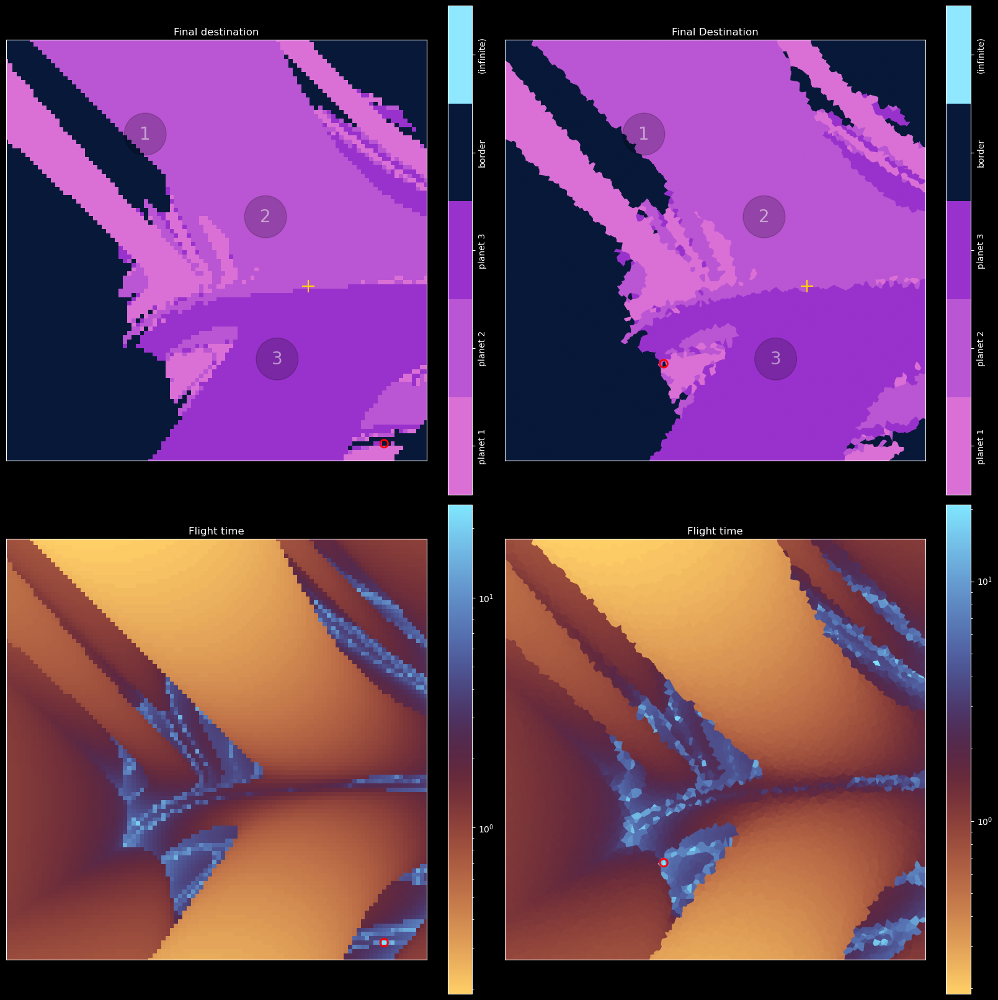

In [11]:
fig, axs = plt.subplots(2,2,figsize=(16,16),layout='constrained',subplot_kw = {'aspect':1})
d.heatmap_crashsite(axs[0,0])
dmc.vor_crashsite(axs[0,1])
d.heatmap_score(axs[1,0])
dmc.vor_score(axs[1,1])

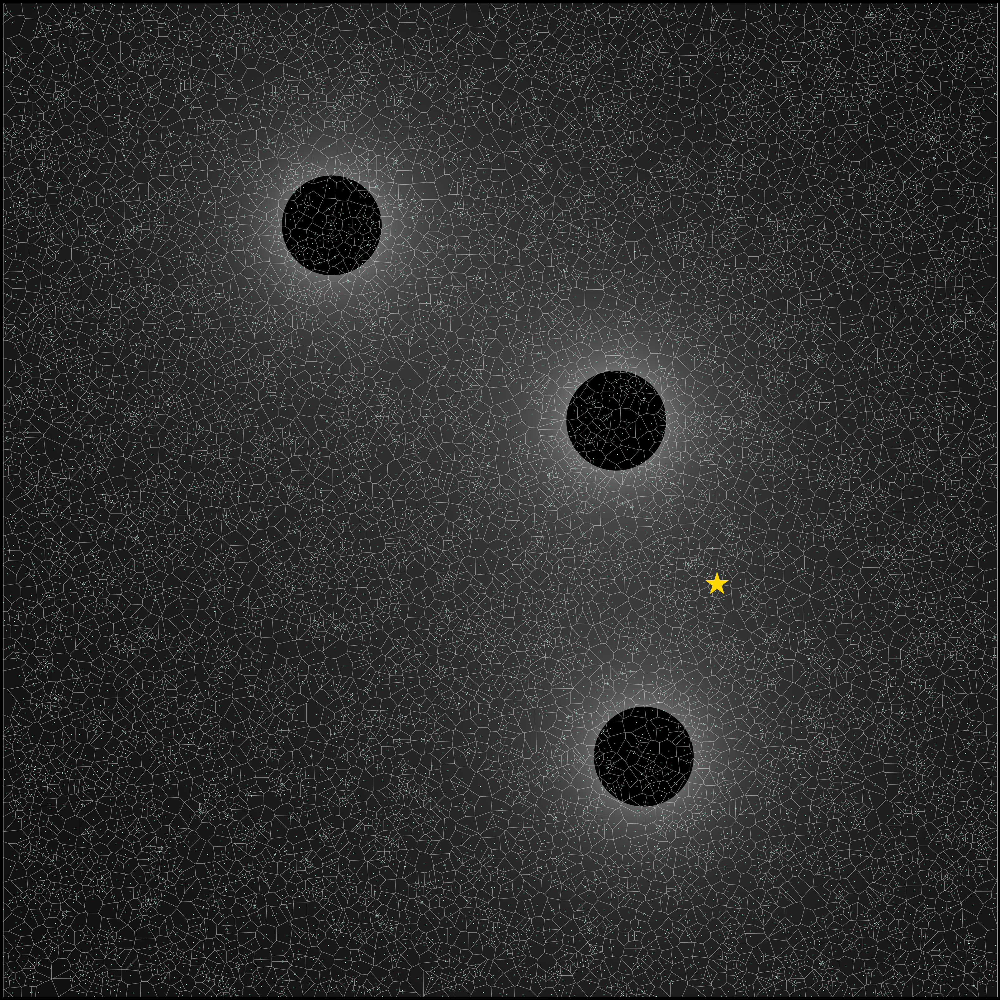

In [12]:
dmc.plot_vor_config()